In [25]:
import mne
from mne.preprocessing import ICA
import autoreject
import pandas as pd
from datetime import datetime
import json

from spectral.ica import compute_ica
from spectral.viz import plot_epochs
from spectral.specparam import specparam2pandas


from spectral.utils import ProjectPaths,print_timestamp

mne.viz.set_browser_backend("matplotlib")
# mne.viz.set_browser_backend("qt")
mne.set_config("MNE_BROWSER_THEME", "light")
# matplotlib.use("Agg")
#print_date_time()
subject = 101


paths = ProjectPaths(subject)
# Create all directories
paths.create_directories()

# This is analysis output, so it goes in the analysis folder
specparam_path = paths.specparam
project_path = paths.root
figures_path = paths.figures
preprocessed_path = paths.preprocessed
epochs_path = paths.epochs
# Print paths to verify
print_timestamp("Setting up project paths")
paths.show()

Created directories for sub-101
Project root: /Users/daniel/PhD/Projects/psd-paths
Setting up project paths: 2025-07-30 22:45:50
────────────────────────────────────────────────────────────
Paths for sub-101
Project Root: /Users/daniel/PhD/Projects/psd-paths
────────────────────────────────────────────────────────────
  analysis     : /Users/daniel/PhD/Projects/psd-paths/data/derrivatives/sub-101/analysis
  data         : /Users/daniel/PhD/Projects/psd-paths/data/raw/sub-101
  epochs       : /Users/daniel/PhD/Projects/psd-paths/data/derrivatives/sub-101/epochs
  figures      : /Users/daniel/PhD/Projects/psd-paths/outputs/figures/sub-101
  ica          : /Users/daniel/PhD/Projects/psd-paths/data/derrivatives/sub-101/analysis/ica
  logs         : /Users/daniel/PhD/Projects/psd-paths/data/logs
  outputs      : /Users/daniel/PhD/Projects/psd-paths/outputs
  preprocessed : /Users/daniel/PhD/Projects/psd-paths/data/derrivatives/sub-101/preprocessed
  processing   : /Users/daniel/PhD/Projects

# Start raport


Opening raw data file /Users/daniel/PhD/Projects/psd-paths/data/derrivatives/sub-101/preprocessed/sub-101_filtered_raw.fif...
    Range : 0 ... 294397 =      0.000 ...   294.397 secs
Ready.
Reading 0 ... 294397  =      0.000 ...   294.397 secs...
Embedding : jquery-3.6.0.min.js
Embedding : bootstrap.bundle.min.js
Embedding : bootstrap.min.css
Embedding : bootstrap-table/bootstrap-table.min.js
Embedding : bootstrap-table/bootstrap-table.min.css
Embedding : bootstrap-table/bootstrap-table-copy-rows.min.js
Embedding : bootstrap-table/bootstrap-table-export.min.js
Embedding : bootstrap-table/tableExport.min.js
Embedding : bootstrap-icons/bootstrap-icons.mne.min.css
Embedding : highlightjs/highlight.min.js
Embedding : highlightjs/atom-one-dark-reasonable.min.css
Effective window size : 2.048 (s)
Plotting power spectral density (dB=True).


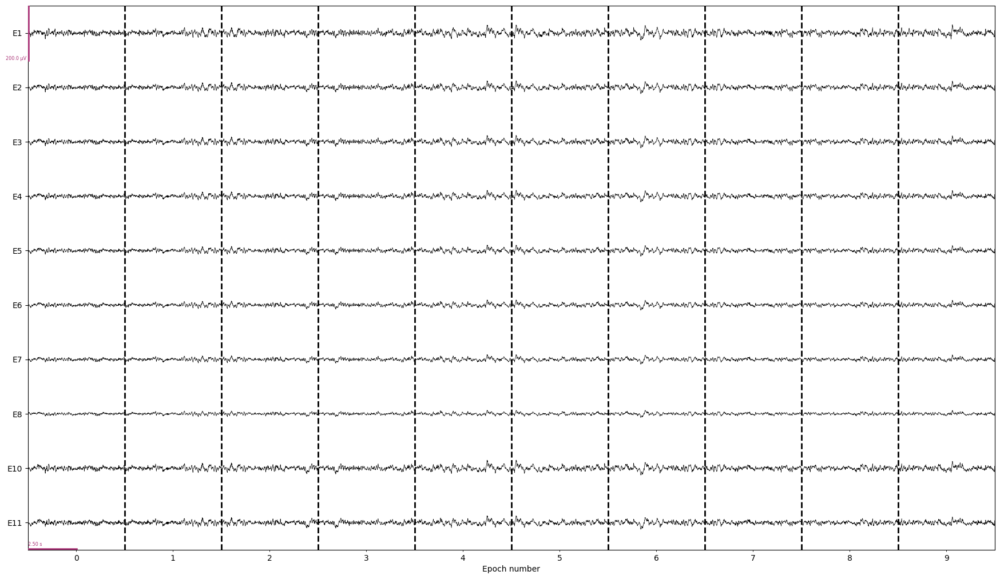

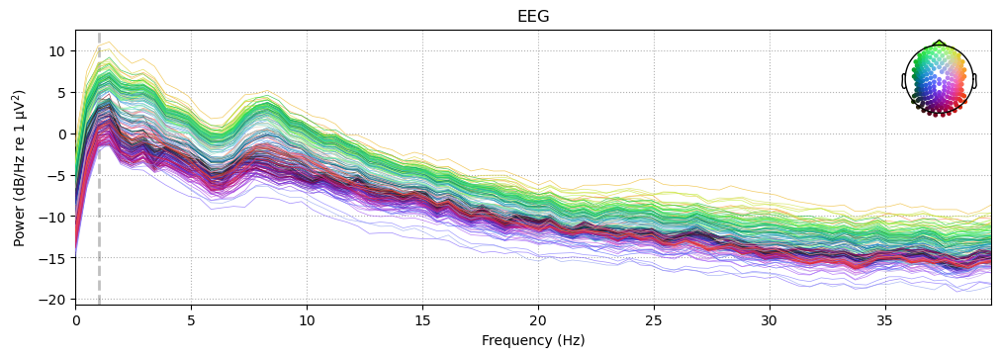

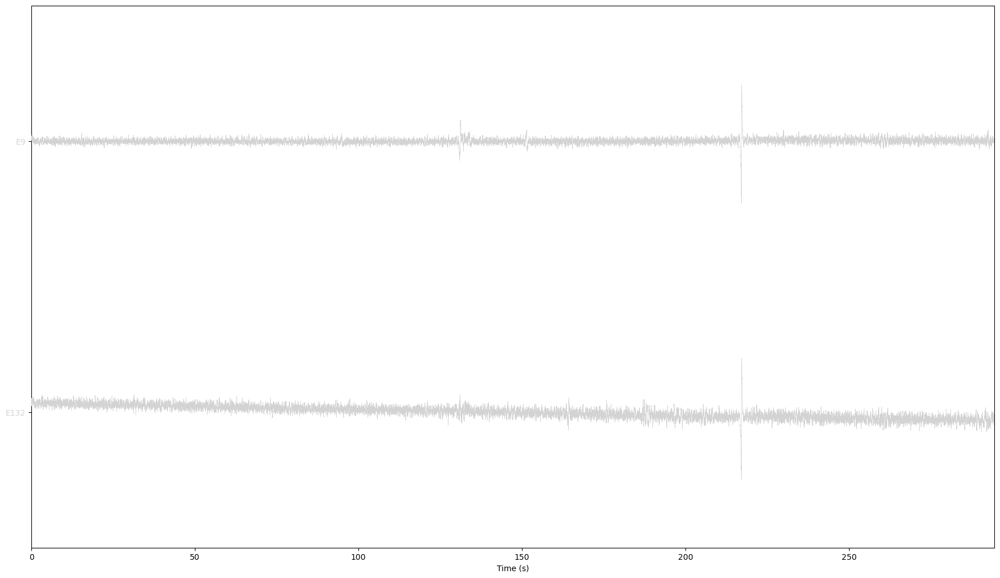

In [26]:
clean_raw = mne.io.read_raw_fif(
    f"{preprocessed_path}/sub-{subject}_filtered_raw.fif", preload=True
)
report = mne.Report(title=f"Report for subject {subject}", subject=subject)
report.add_raw(
    raw=clean_raw, title="Raw", psd=True, butterfly=True, scalings="auto"
)  # omit PSD plot
total_duration = clean_raw.times[-1]

try:
    # Add bad channels plot
    bad_channel_plot = clean_raw.plot(
        picks=clean_raw.info["bads"],
        duration=total_duration,
        scalings=dict(eeg=1e-4),
        show_scrollbars=False,
    )
    report.add_figure(bad_channel_plot, title="Rejected bad channels")
except Exception as e:
    print(f"An error occurred: {e}")

# ICA


ICA should be applied before the spatial interpolation of the non-functional channels.


In [27]:
epochs_good = mne.read_epochs(
    f"{epochs_path}/sub-{subject}_good_epochs-epo.fif"
)
ica = compute_ica(epochs_good, n_components=0.99, method="picard")


print(ica.n_components_)
if ica.n_components_ > 50:
    ica = compute_ica(epochs_good, n_components=50, method="picard")
ica.save(f"{paths.ica}/sub-{subject}_my_ica_model-ica.fif", overwrite=True)

Reading /Users/daniel/PhD/Projects/psd-paths/data/derrivatives/sub-101/epochs/sub-101_good_epochs-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    5000.00 ms
        0 CTF compensation matrices available
Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated
Fitting ICA to data using 202 channels (please be patient, this may take a while)
Selecting by explained variance: 17 components


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/mne/utils/linalg.py:243: RuntimeWarning: divide by zero encountered in matmul
  return (u @ vh[:rank]).conj().T
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/mne/utils/linalg.py:243: RuntimeWarning: overflow encountered in matmul
  return (u @ vh[:rank]).conj().T
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/mne/utils/linalg.py:243: RuntimeWarning: invalid value encountered in matmul
  return (u @ vh[:rank]).conj().T


Fitting ICA took 10.2s.
17
Overwriting existing file.
Writing ICA solution to /Users/daniel/PhD/Projects/psd-paths/data/derrivatives/sub-101/analysis/ica/sub-101_my_ica_model-ica.fif...
Overwriting existing file.


Method,picard
Fit parameters,ortho=Falseextended=Truemax_iter=500
Fit,65 iterations on epochs (380076 samples)
ICA components,17
Available PCA components,202
Channel types,eeg
ICA components marked for exclusion,—


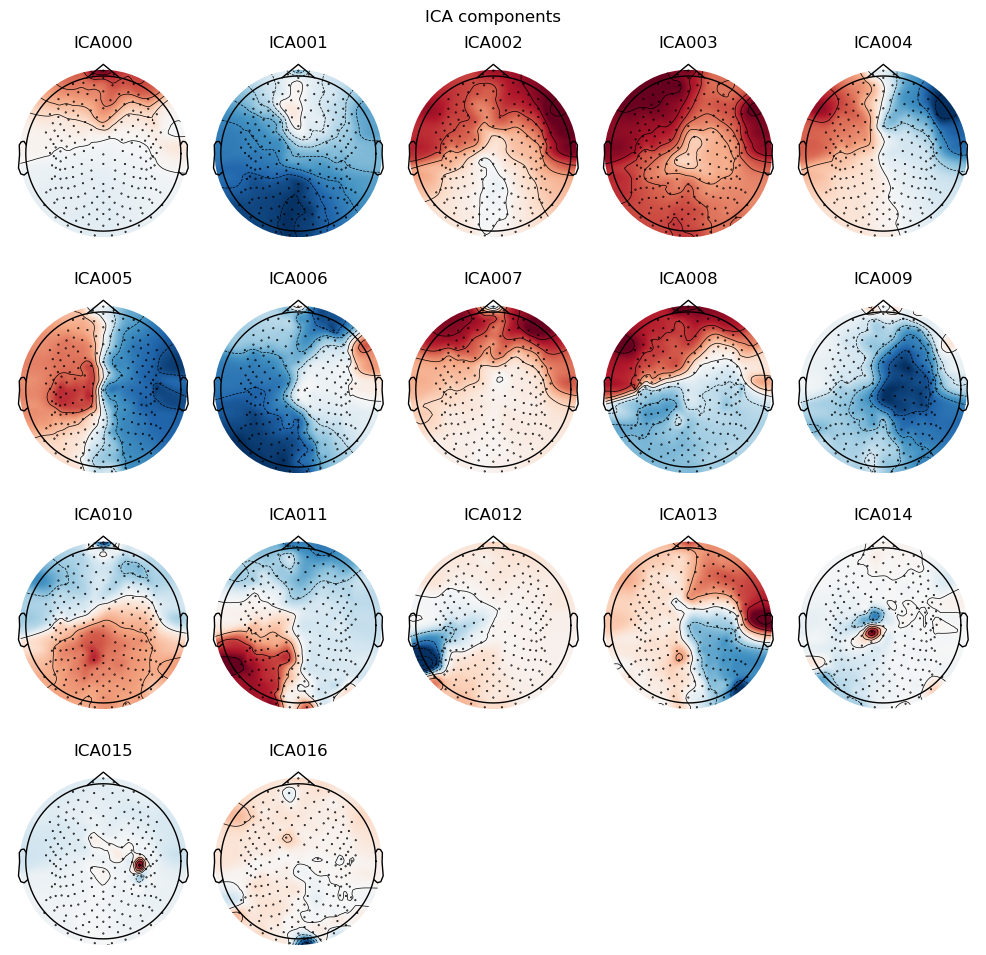

In [28]:
ica_plot_components = ica.plot_components()

Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


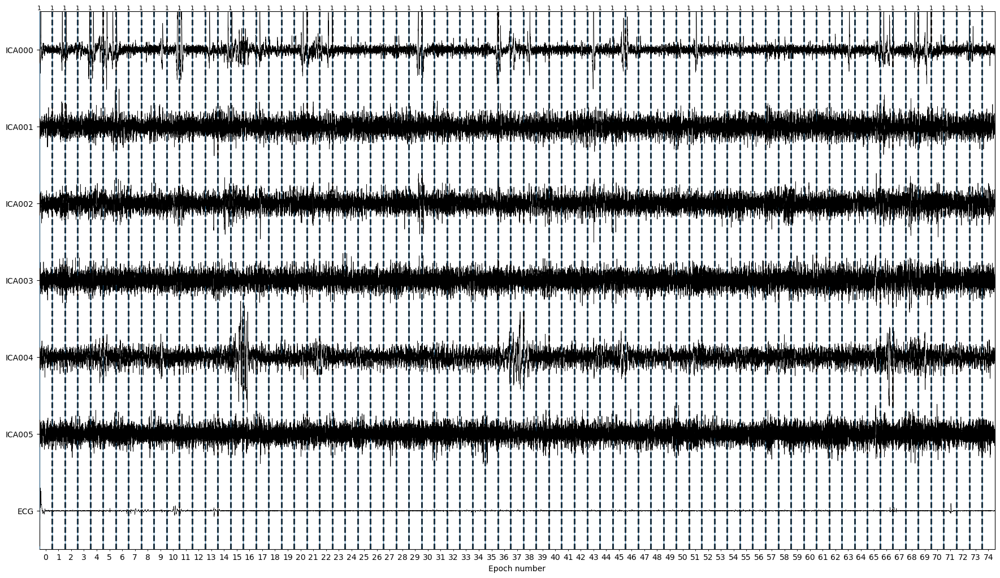

Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


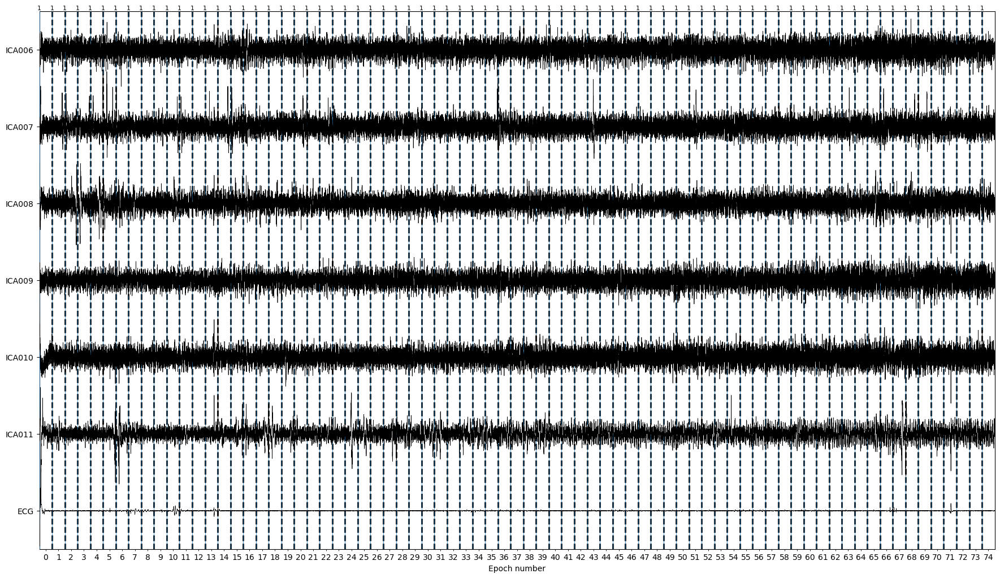

Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


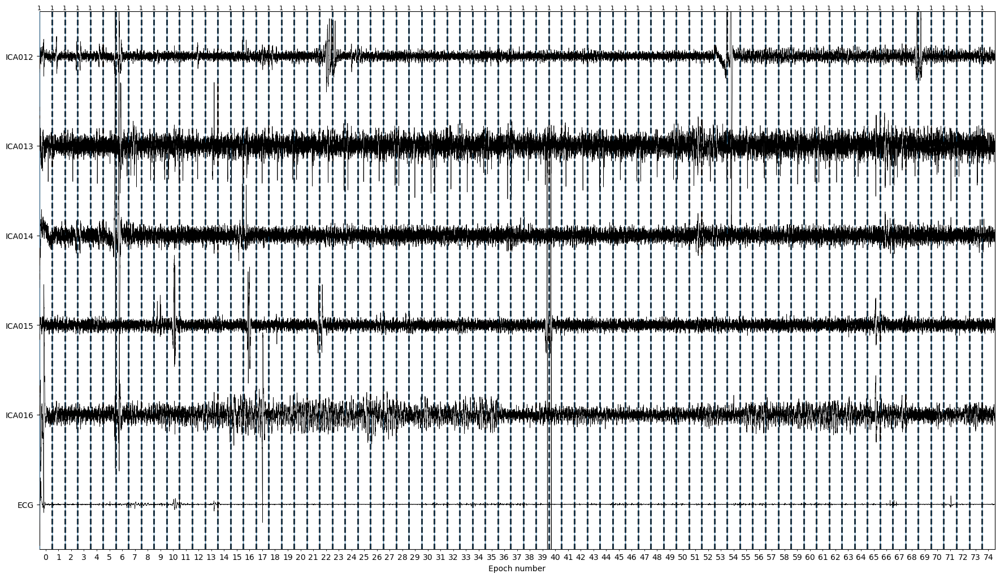

In [29]:
chunk_size = 6
chunks = [
    range(i, min(i + chunk_size, ica.n_components_))
    for i in range(0, ica.n_components_, chunk_size)
]

for chunk in chunks:
    ica_plot = ica.plot_sources(
        epochs_good,
        picks=chunk,
        show_scrollbars=False,
        start=0,
        stop=len(epochs_good) - 1,
    )

Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


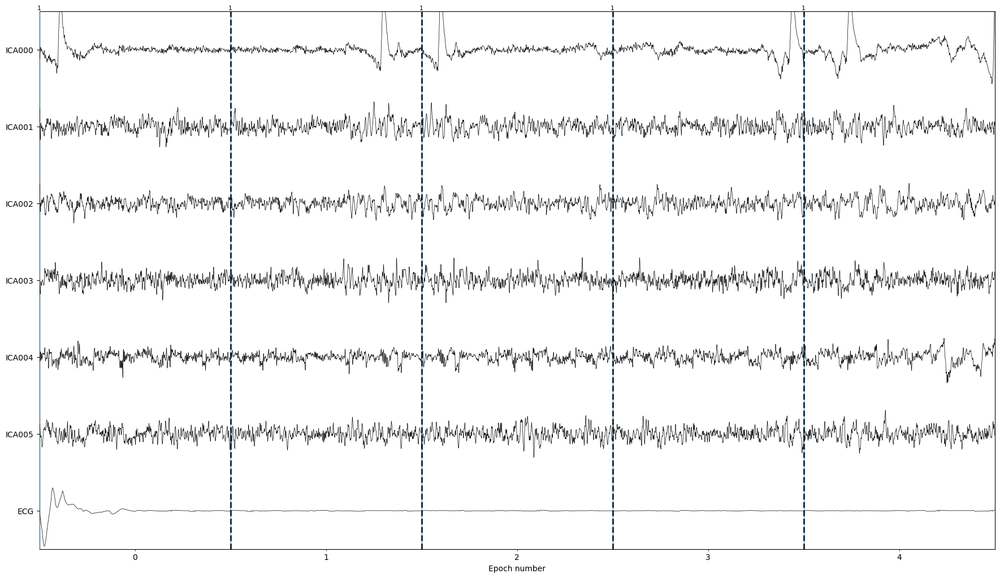

Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


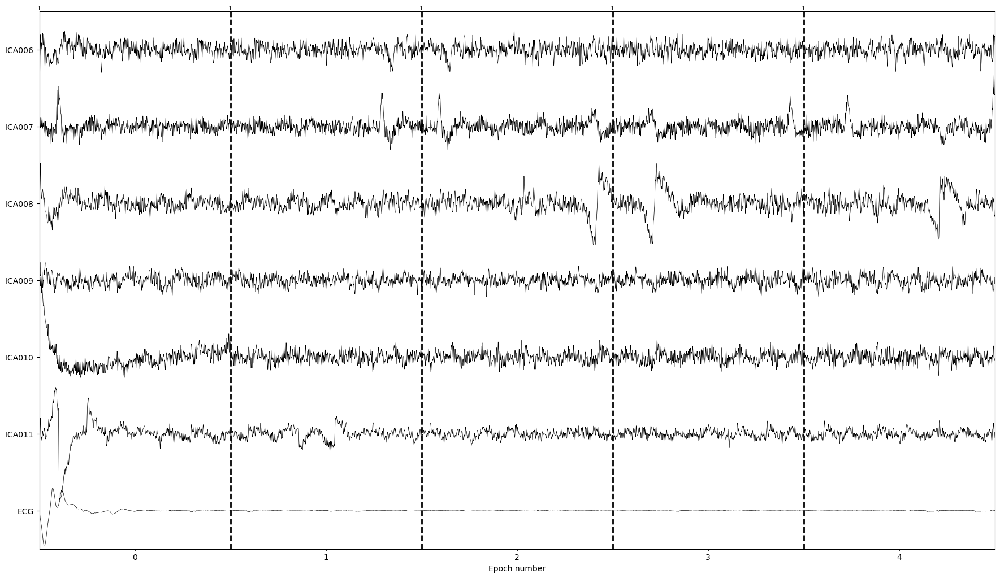

Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


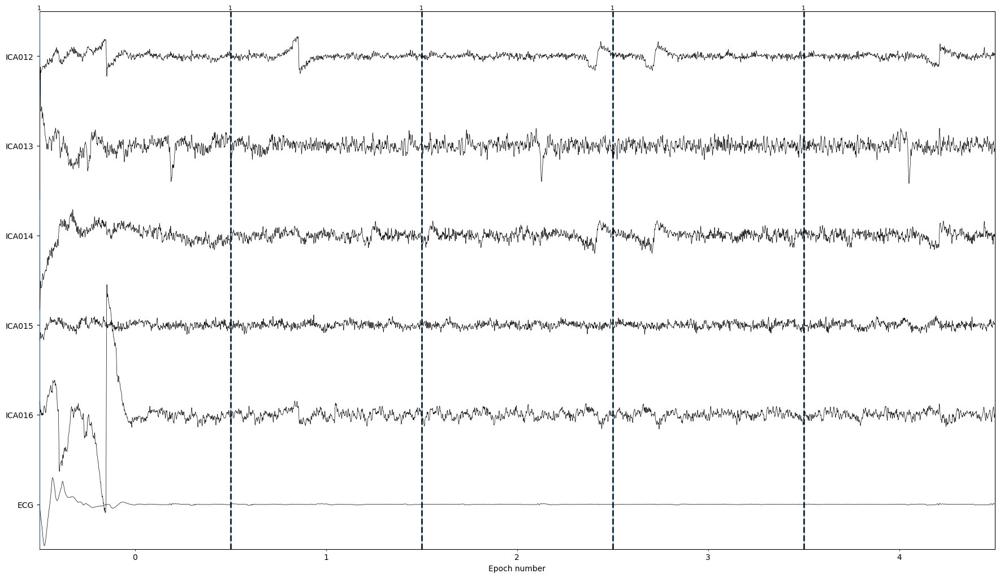

In [30]:
for chunk in chunks:
    ica_plot = ica.plot_sources(
        epochs_good,
        picks=chunk,
        show_scrollbars=False,
        start=0,
        stop=5,
    )

Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


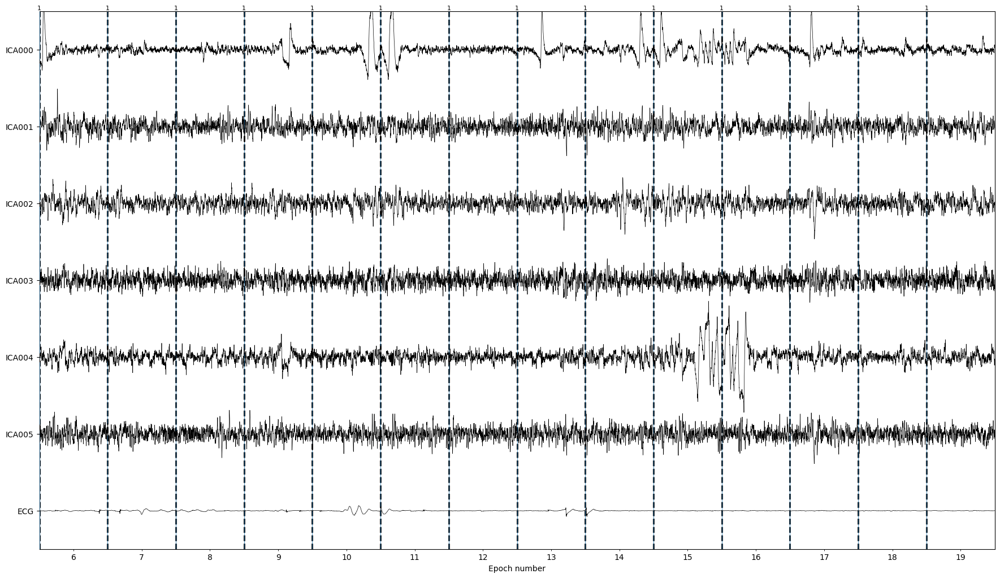

Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


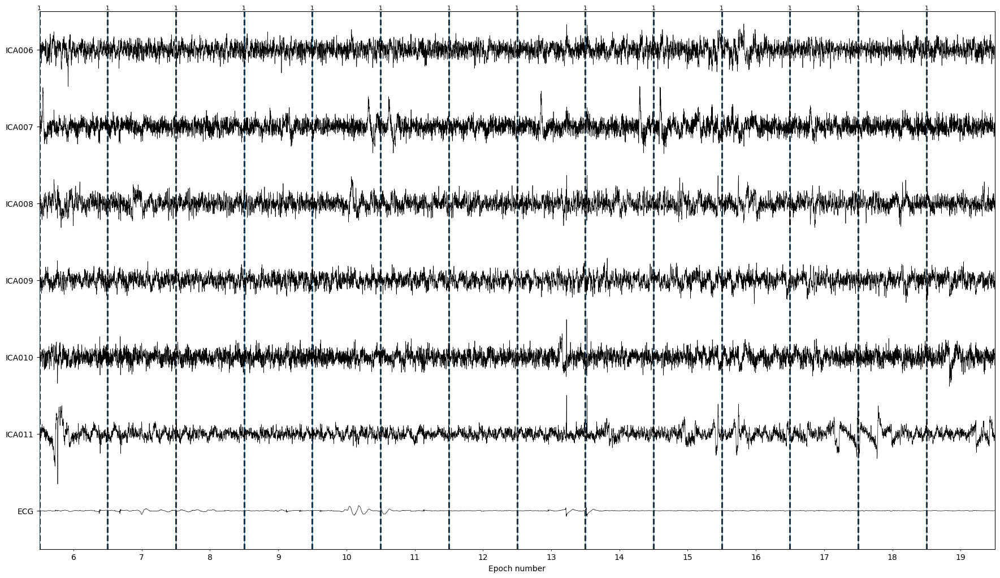

Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


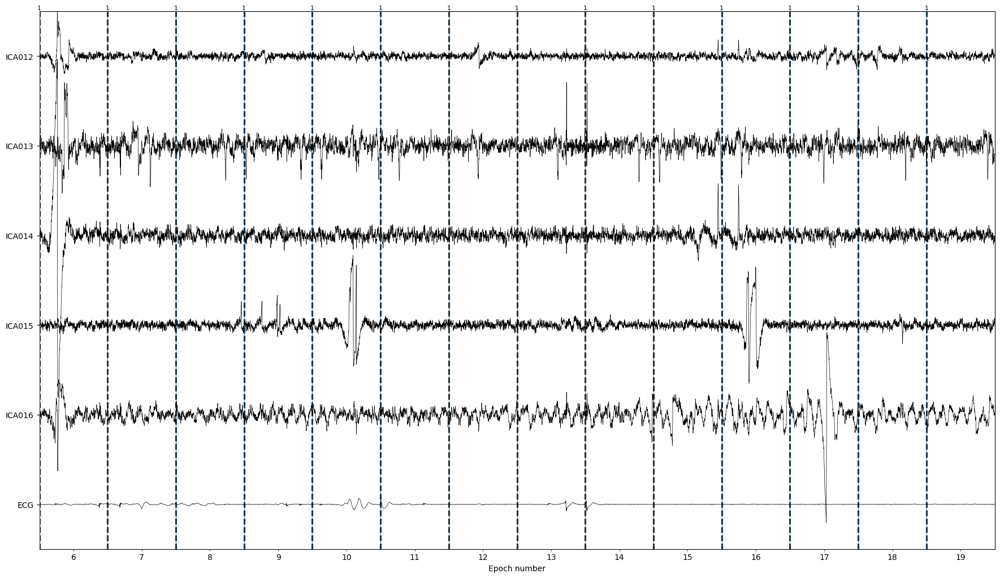

In [31]:
for chunk in chunks:
    ica_plot = ica.plot_sources(
        epochs_good,
        picks=chunk,
        show_scrollbars=False,
        start=6,
        stop=20,
    )

In [32]:
explained_var_ratio = ica.get_explained_variance_ratio(epochs_good)
for channel_type, ratio in explained_var_ratio.items():
    print(
        f"Fraction of {
            channel_type} variance explained by all components: "
        f"{ratio}"
    )

/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/mne/preprocessing/ica.py:2400: RuntimeWarning: divide by zero encountered in matmul
  mixing = pca_components.T @ mixing
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/mne/preprocessing/ica.py:2400: RuntimeWarning: overflow encountered in matmul
  mixing = pca_components.T @ mixing
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/mne/preprocessing/ica.py:2400: RuntimeWarning: invalid value encountered in matmul
  mixing = pca_components.T @ mixing


Fraction of eeg variance explained by all components: 0.9900736926660144


# ICA label gui


In [33]:
from mne_icalabel.gui import label_ica_components

# gui = label_ica_components(epochs_good, ica)

# Removing components


In [34]:
ecg_indices, ecg_scores = ica.find_bads_ecg(
    clean_raw, method="correlation", threshold="auto"
)

try:
    # ica_plot = ica.plot_sources(eeg_data)
    # Exclude blink artifact components (use Fp1 as EOG proxy)

    # ica.exclude = np.argwhere(abs(eog_scores) > 0.5).ravel().tolist()
    _ = ica.plot_sources(
        epochs_good,
        show_scrollbars=False,
        picks=ecg_indices,
        start=0,
        stop=300.0,
    )
    _ = ica.plot_properties(epochs_good, picks=ecg_indices)
except Exception as e:
    # If an exception occurs, print the error message
    print("An error occurred:", e)

... filtering ICA sources
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 8.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 7.75 Hz)
- Upper passband edge: 16.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 16.25 Hz)
- Filter length: 10000 samples (10.000 s)

... filtering target
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 8.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 7.75 Hz)
- Upper passband edge: 16.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 16.25 Hz)
- Filter length: 10000 s

/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/stats/_stats_py.py:4776: RuntimeWarning: overflow encountered in vecdot
  r = xp.vecdot(xm / normxm, ym / normym, axis=axis)


In [35]:
exclude = sorted([])
# exclude = sorted([0, 1, 2, 3, 11, 12, 14])
exclude = sorted([0, 1, 7])
ica.exclude = exclude
epochs_clean_manual = ica.apply(epochs_good.copy(), exclude=ica.exclude)
print(ica)

epochs_clean_manual.save(
    f"{paths.ica}/sub-{subject}_clean_ica-manual-epo.fif", overwrite=True
)

# Define a dictionary
my_dict = {
    "bad_channels": clean_raw.info["bads"],
    "bad_ica": exclude,
}
json_path = f"{paths.ica}/sub-{subject}_prepro_info_json"

# Save the dictionary to a JSON file
with open(json_path, "w") as f:
    json.dump(my_dict, f)

Applying ICA to Epochs instance
    Transforming to ICA space (17 components)
    Zeroing out 3 ICA components
    Projecting back using 202 PCA components


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/mne/preprocessing/ica.py:2400: RuntimeWarning: divide by zero encountered in matmul
  mixing = pca_components.T @ mixing
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/mne/preprocessing/ica.py:2400: RuntimeWarning: overflow encountered in matmul
  mixing = pca_components.T @ mixing
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/mne/preprocessing/ica.py:2400: RuntimeWarning: invalid value encountered in matmul
  mixing = pca_components.T @ mixing


<ICA | epochs decomposition, method: picard (fit in 65 iterations on 380076 samples), 17 ICA components (202 PCA components available), channel types: eeg, 3 sources marked for exclusion>


    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: divide by zero encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: overflow encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: invalid value encountered in matmul
  return xp.matmul(x1, x2, **kwargs)


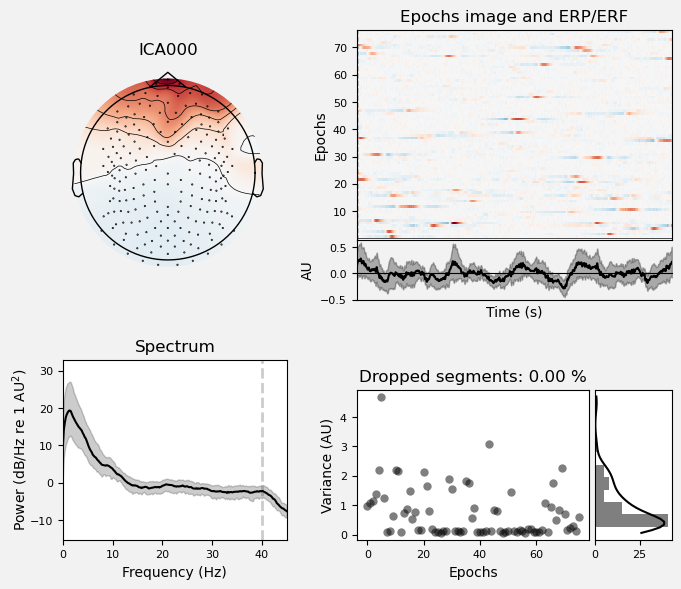

    Using multitaper spectrum estimation with 7 DPSS windows


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: divide by zero encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: overflow encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: invalid value encountered in matmul
  return xp.matmul(x1, x2, **kwargs)


Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


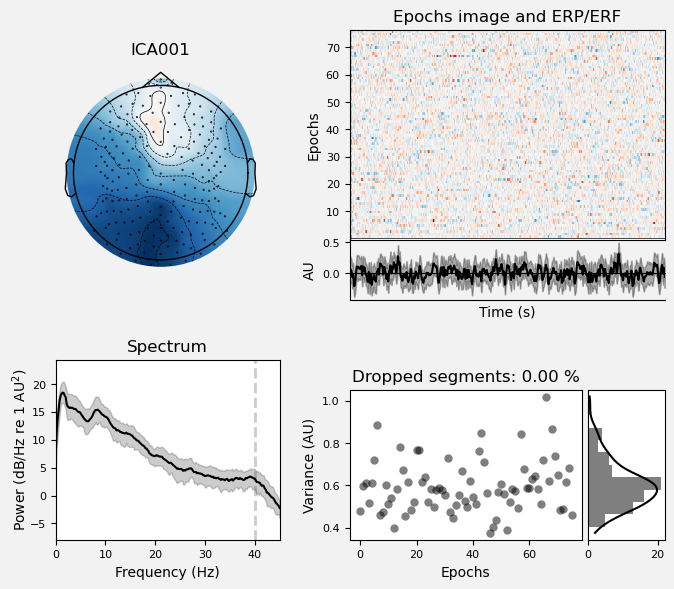

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: divide by zero encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: overflow encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: invalid value encountered in matmul
  return xp.matmul(x1, x2, **kwargs)


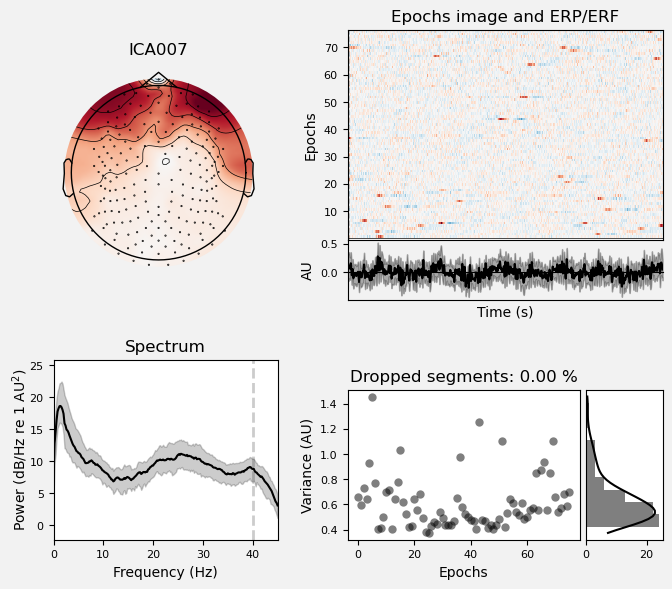

In [36]:
for component in sorted(exclude):
    ica_plot = ica.plot_properties(
        epochs_good, picks=component, psd_args={"fmax": 45.0}
    )

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: divide by zero encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: overflow encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: invalid value encountered in matmul
  return xp.matmul(x1, x2, **kwargs)


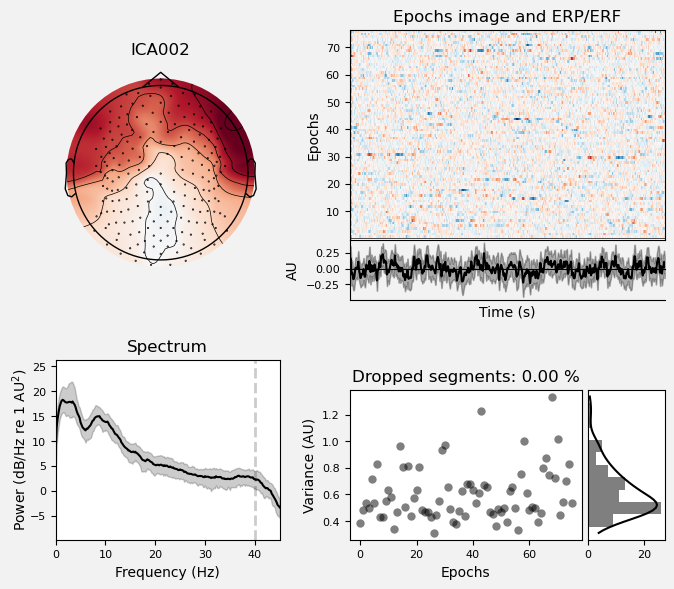

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: divide by zero encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: overflow encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: invalid value encountered in matmul
  return xp.matmul(x1, x2, **kwargs)


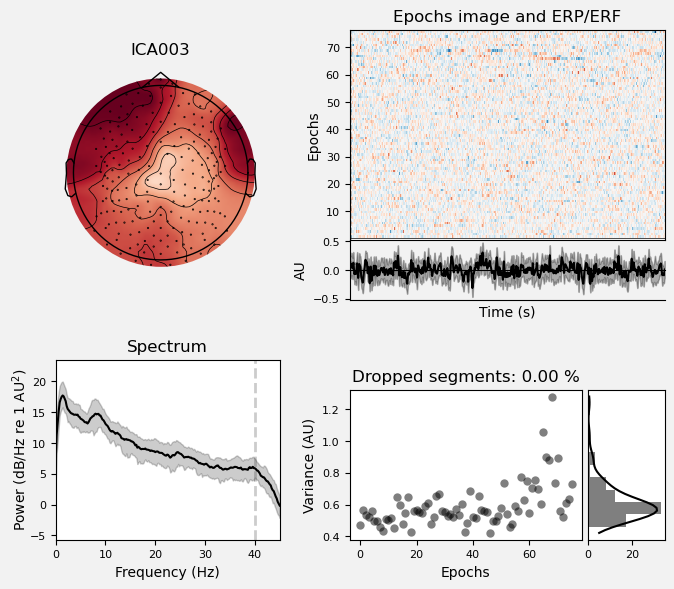

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: divide by zero encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: overflow encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: invalid value encountered in matmul
  return xp.matmul(x1, x2, **kwargs)


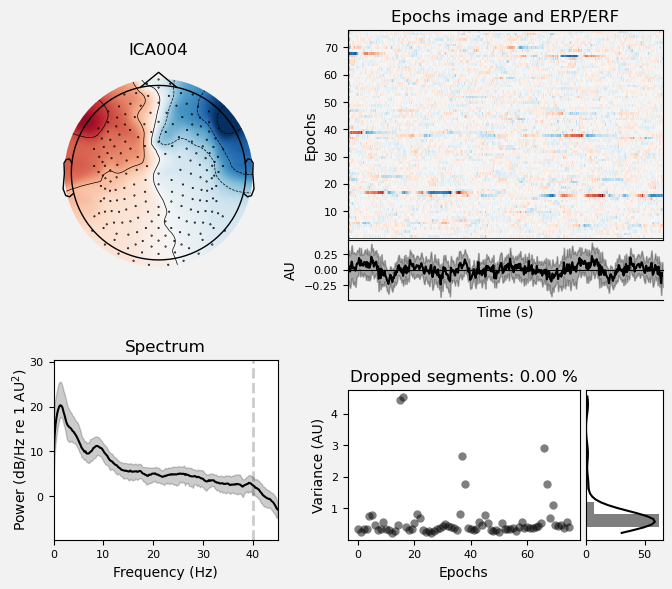

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: divide by zero encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: overflow encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: invalid value encountered in matmul
  return xp.matmul(x1, x2, **kwargs)


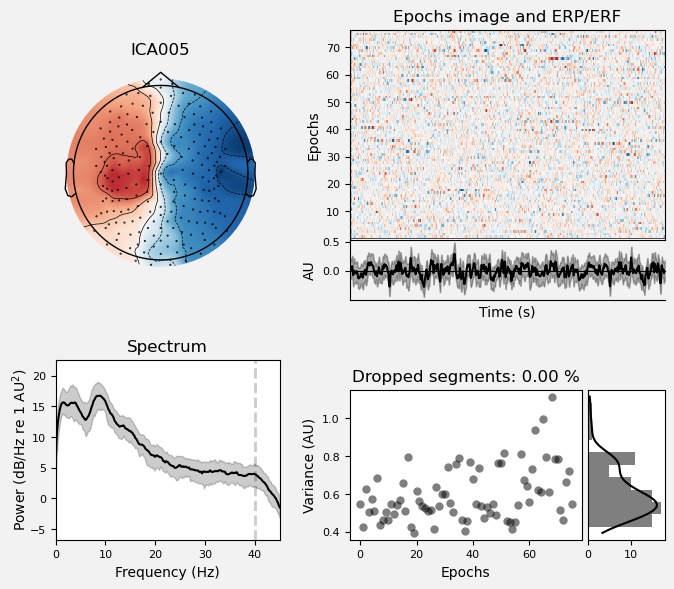

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: divide by zero encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: overflow encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: invalid value encountered in matmul
  return xp.matmul(x1, x2, **kwargs)


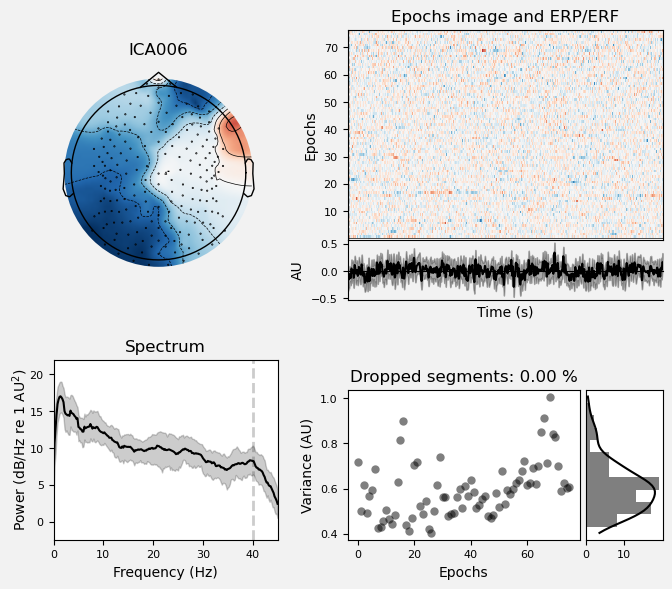

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: divide by zero encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: overflow encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: invalid value encountered in matmul
  return xp.matmul(x1, x2, **kwargs)


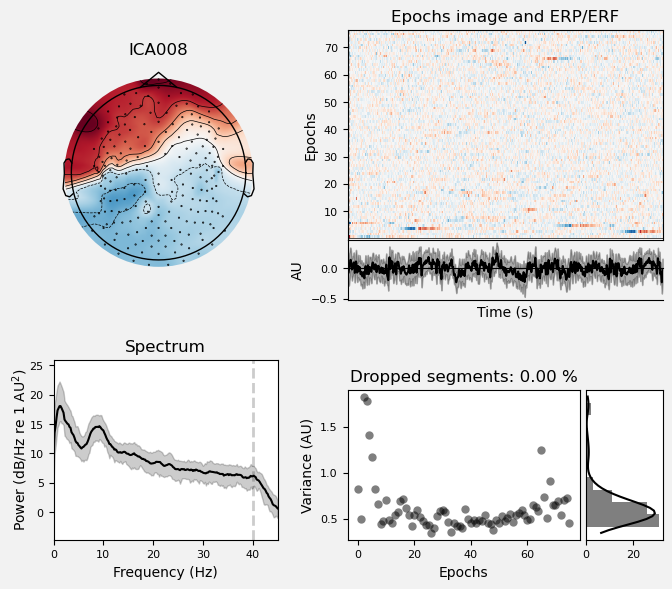

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: divide by zero encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: overflow encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: invalid value encountered in matmul
  return xp.matmul(x1, x2, **kwargs)


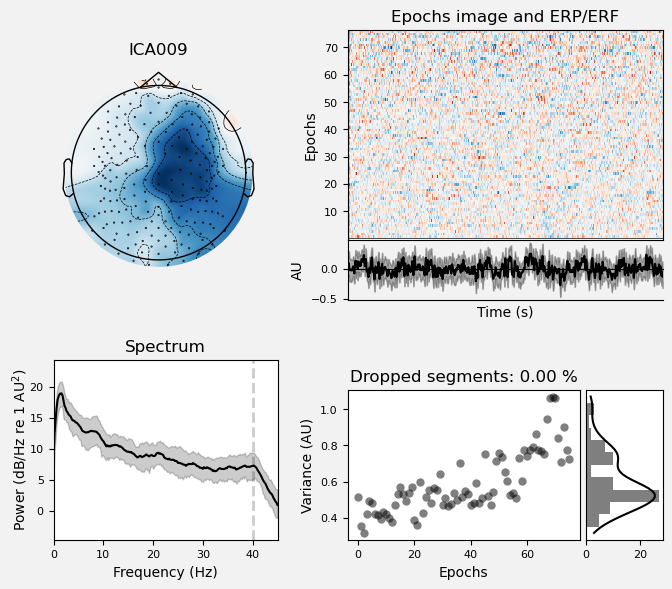

    Using multitaper spectrum estimation with 7 DPSS windows


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: divide by zero encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: overflow encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: invalid value encountered in matmul
  return xp.matmul(x1, x2, **kwargs)


Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


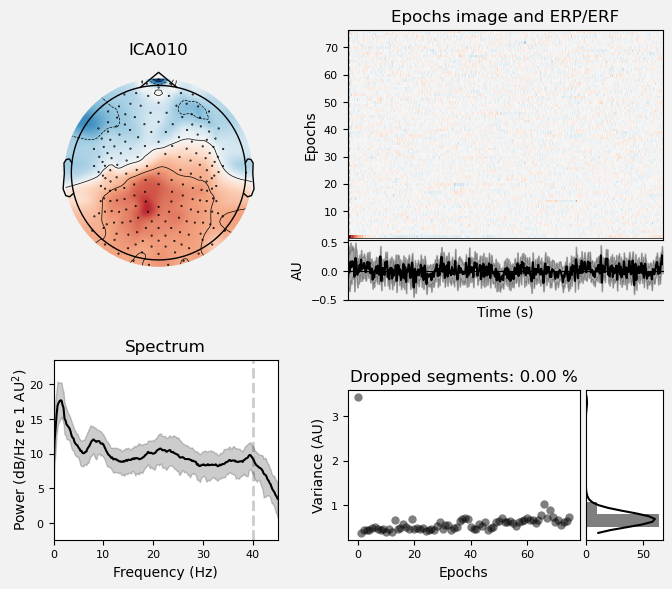

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: divide by zero encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: overflow encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: invalid value encountered in matmul
  return xp.matmul(x1, x2, **kwargs)


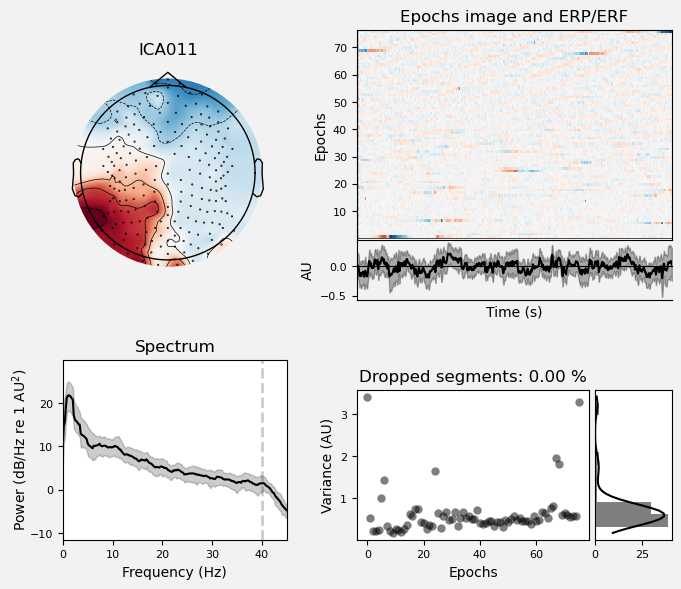

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: divide by zero encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: overflow encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: invalid value encountered in matmul
  return xp.matmul(x1, x2, **kwargs)


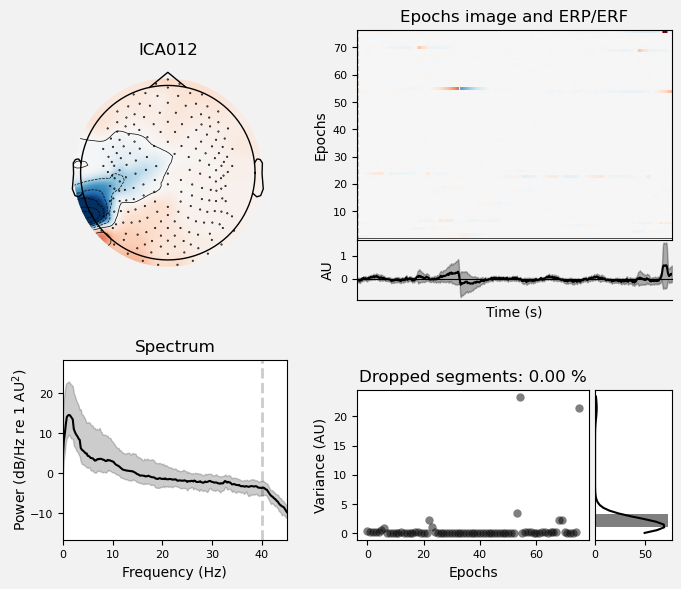

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: divide by zero encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: overflow encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: invalid value encountered in matmul
  return xp.matmul(x1, x2, **kwargs)


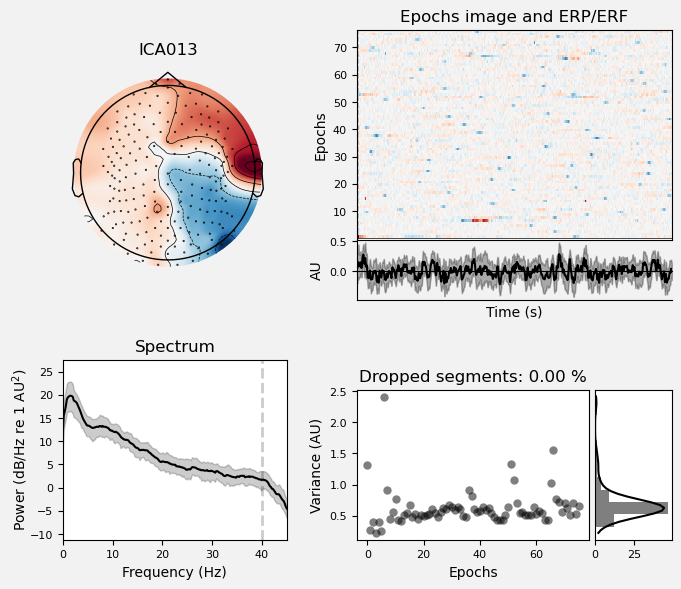

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: divide by zero encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: overflow encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: invalid value encountered in matmul
  return xp.matmul(x1, x2, **kwargs)


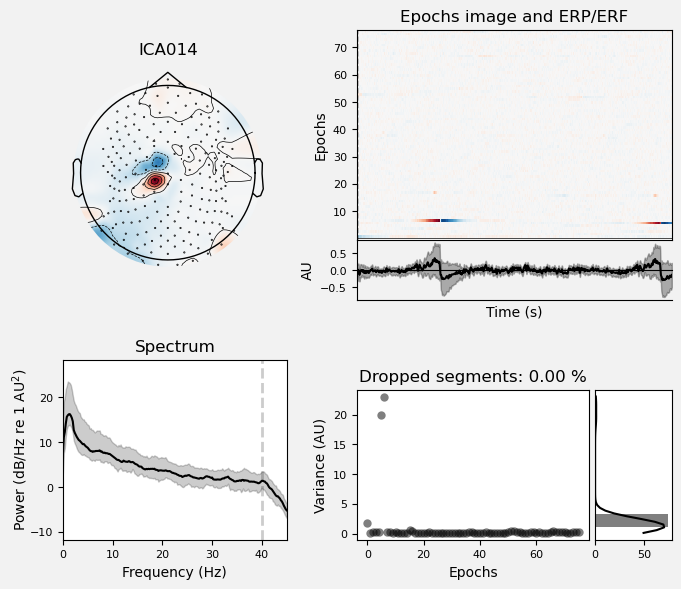

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: divide by zero encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: overflow encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: invalid value encountered in matmul
  return xp.matmul(x1, x2, **kwargs)


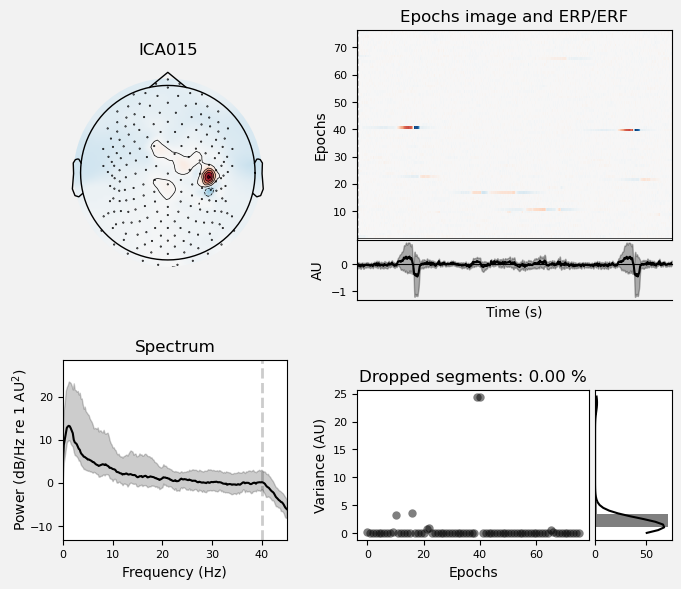

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: divide by zero encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: overflow encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: invalid value encountered in matmul
  return xp.matmul(x1, x2, **kwargs)


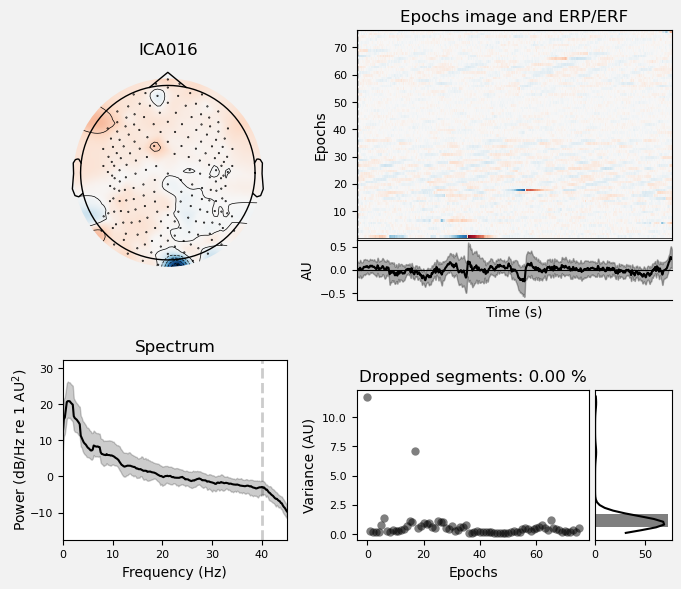

In [37]:
ica_indices = list(range(ica.n_components_))
good_components = [i for i in ica_indices if i not in exclude]
for component in sorted(good_components):
    ica_plot = ica.plot_properties(
        epochs_good, picks=component, psd_args={"fmax": 45.0}
    )

Applying ICA to Evoked instance
    Transforming to ICA space (17 components)
    Zeroing out 3 ICA components
    Projecting back using 202 PCA components


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/mne/preprocessing/ica.py:2400: RuntimeWarning: divide by zero encountered in matmul
  mixing = pca_components.T @ mixing
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/mne/preprocessing/ica.py:2400: RuntimeWarning: overflow encountered in matmul
  mixing = pca_components.T @ mixing
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/mne/preprocessing/ica.py:2400: RuntimeWarning: invalid value encountered in matmul
  mixing = pca_components.T @ mixing


    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: divide by zero encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: overflow encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: invalid value encountered in matmul
  return xp.matmul(x1, x2, **kwargs)


    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: divide by zero encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: overflow encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: invalid value encountered in matmul
  return xp.matmul(x1, x2, **kwargs)


    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: divide by zero encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: overflow encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: invalid value encountered in matmul
  return xp.matmul(x1, x2, **kwargs)


Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated


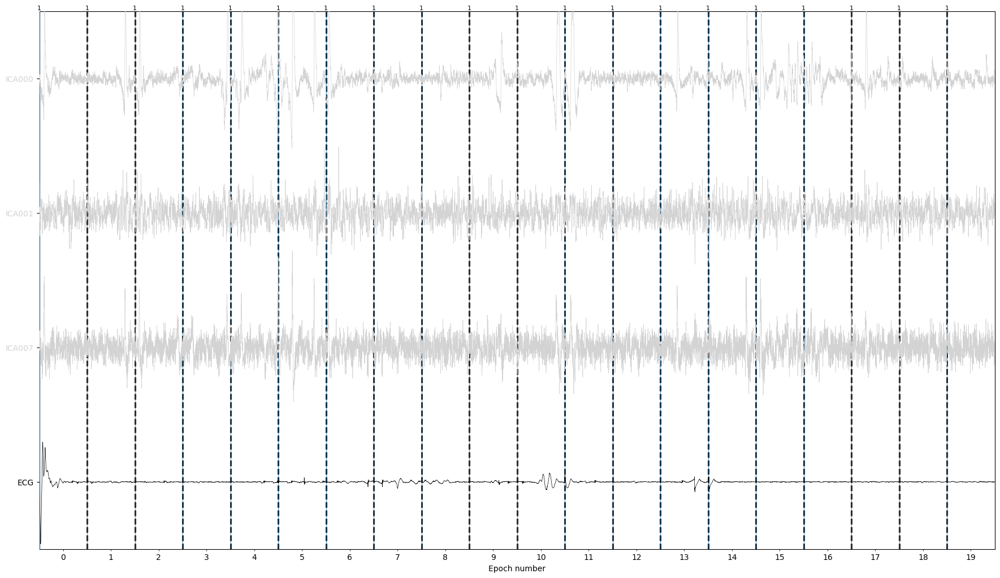

In [38]:
# Add location of bad channels
try:
    report.add_ica(
        ica=ica,
        title="ICA cleaning",
        picks=ica.exclude,  # plot the excluded EOG components
        inst=epochs_good,
    )
    # Add just sources of the removed components
    ica_figure_sources = ica.plot_sources(
        epochs_good, picks=exclude, show_scrollbars=False
    )
    report.add_figure(ica_figure_sources, title="ICA rejected components")

except Exception as e:
    # If an exception occurs, print the error message
    print("An error occurred:", e)

# ICA plot overlay


Applying ICA to Evoked instance
    Transforming to ICA space (17 components)
    Zeroing out 3 ICA components
    Projecting back using 202 PCA components


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/mne/preprocessing/ica.py:2400: RuntimeWarning: divide by zero encountered in matmul
  mixing = pca_components.T @ mixing
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/mne/preprocessing/ica.py:2400: RuntimeWarning: overflow encountered in matmul
  mixing = pca_components.T @ mixing
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/mne/preprocessing/ica.py:2400: RuntimeWarning: invalid value encountered in matmul
  mixing = pca_components.T @ mixing


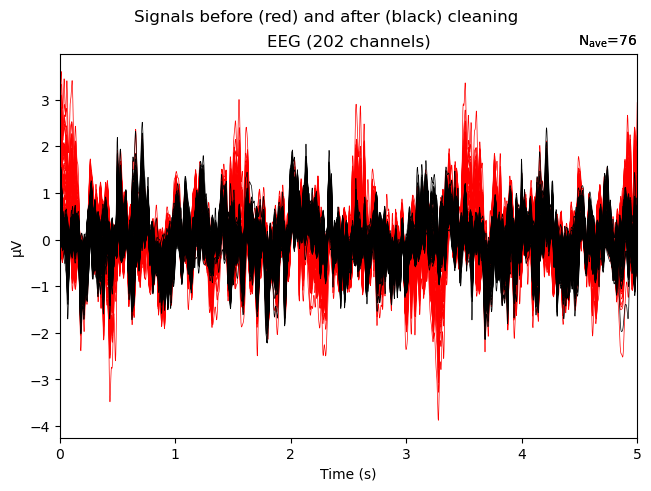

In [39]:
cleaned_plot = ica.plot_overlay(epochs_good.average())

No projector specified for this dataset. Please consider the method self.add_proj.


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/signal/_signaltools.py:4247: RuntimeWarning: divide by zero encountered in matmul
  newdata[sl] = newdata[sl] - A @ coef
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/signal/_signaltools.py:4247: RuntimeWarning: overflow encountered in matmul
  newdata[sl] = newdata[sl] - A @ coef
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/signal/_signaltools.py:4247: RuntimeWarning: invalid value encountered in matmul
  newdata[sl] = newdata[sl] - A @ coef


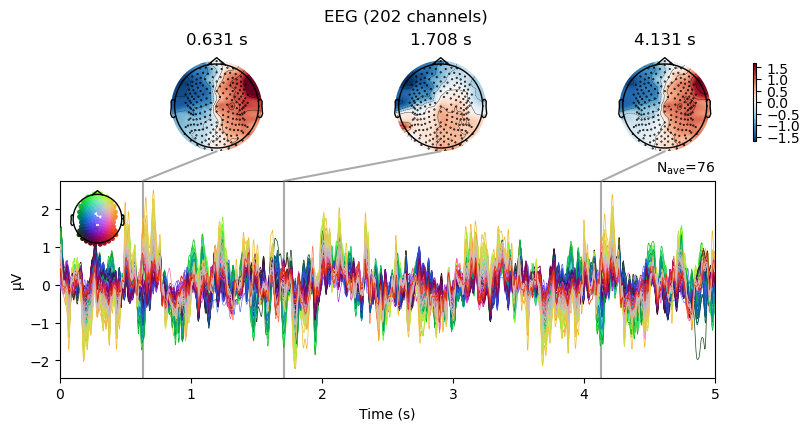

Effective window size : 2.048 (s)
Plotting power spectral density (dB=True).
Averaging across epochs before plotting...


In [40]:
epochs_plot, _, epochs_plot_psd = plot_epochs(
    epochs_clean_manual, figures_path=figures_path, subject=subject, fmax=40.0
)
report.add_figure(epochs_plot, title="Cleaned epochs after ICA")
report.add_figure(epochs_plot_psd, title="Cleaned epochs after ICA - PSD")

In [41]:
ica.save(f"{paths.ica}/sub-{subject}_my_ica_model-ica.fif", overwrite=True)

Overwriting existing file.
Writing ICA solution to /Users/daniel/PhD/Projects/psd-paths/data/derrivatives/sub-101/analysis/ica/sub-101_my_ica_model-ica.fif...
Overwriting existing file.


Method,picard
Fit parameters,ortho=Falseextended=Truemax_iter=500
Fit,65 iterations on epochs (380076 samples)
ICA components,17
Available PCA components,202
Channel types,eeg
ICA components marked for exclusion,ICA000ICA001ICA007


# Final part of the analysis


In [42]:
ica_loaded = mne.preprocessing.read_ica(
    f"{paths.ica}/sub-{subject}_my_ica_model-ica.fif"
)

Reading /Users/daniel/PhD/Projects/psd-paths/data/derrivatives/sub-101/analysis/ica/sub-101_my_ica_model-ica.fif ...
Now restoring ICA solution ...
Ready.


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/mne/utils/linalg.py:243: RuntimeWarning: divide by zero encountered in matmul
  return (u @ vh[:rank]).conj().T
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/mne/utils/linalg.py:243: RuntimeWarning: overflow encountered in matmul
  return (u @ vh[:rank]).conj().T
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/mne/utils/linalg.py:243: RuntimeWarning: invalid value encountered in matmul
  return (u @ vh[:rank]).conj().T


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/linalg/_basic.py:1648: RuntimeWarning: divide by zero encountered in matmul
  B = (u @ vh[:rank]).conj().T
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/linalg/_basic.py:1648: RuntimeWarning: overflow encountered in matmul
  B = (u @ vh[:rank]).conj().T
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/linalg/_basic.py:1648: RuntimeWarning: invalid value encountered in matmul
  B = (u @ vh[:rank]).conj().T
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/mne/channels/interpolation.py:116: RuntimeWarning: divide by zero encountered in matmul
  interpolation = np.hstack([G_to_from, np.ones((n_to, 1))]) @ C_inv[:, :-1]
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/mne/channels/interpolation.py:116: RuntimeWarning: overflow encountered in matmul
  interpolation = np.hstack([G_to_from, np.ones((n_

fitting finished
Dropped 2 epochs: 67, 68


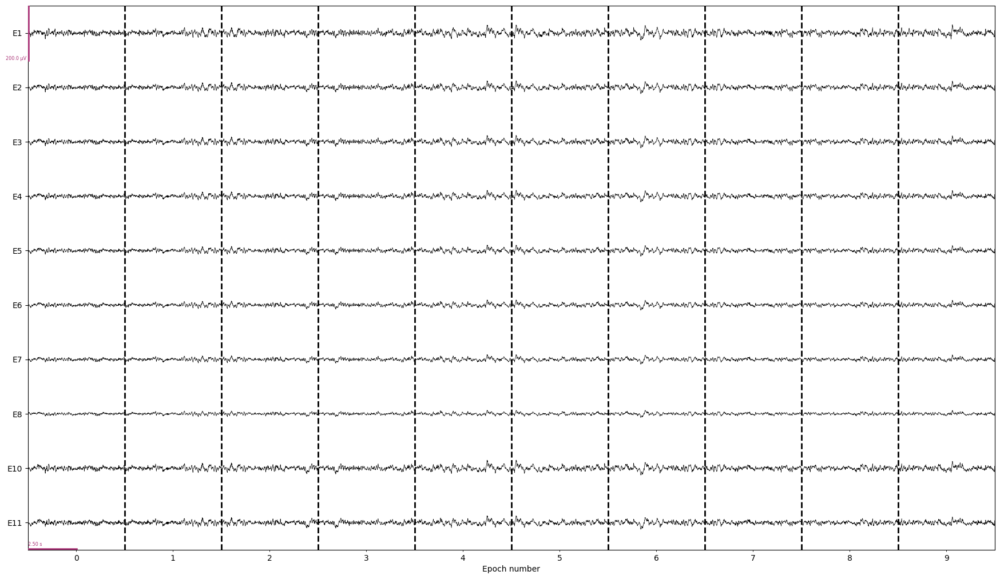

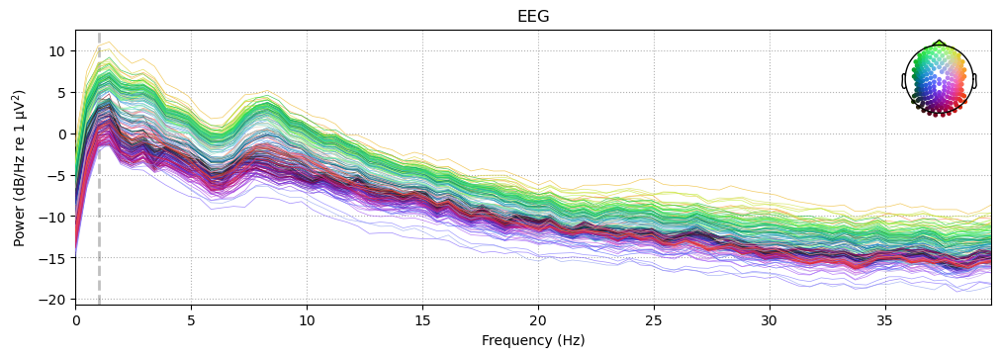

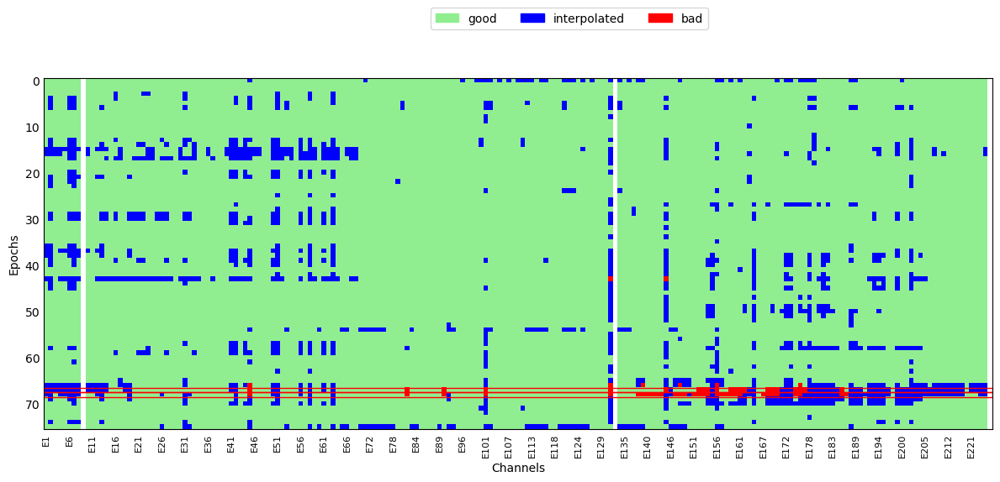

In [43]:
auto_reject_pre_ica = autoreject.AutoReject(
    n_interpolate=[1, 2, 4, 8, 32, 64],
    n_jobs=-1,
    random_state=100,
    thresh_method="bayesian_optimization",
    verbose=False,
    # n_interpolate=np.array([0]),
    # consensus=0.8,
).fit(epochs_clean_manual[:20])
print("fitting finished")
epochs_ar, reject_log = auto_reject_pre_ica.transform(
    epochs_clean_manual, return_log=True
)


# depending of the resampling - different number of epochs are rejected

reject_plot = reject_log.plot("vertical")
report.add_figure(reject_plot, title="Interpolated epochs - AutoReject overview")

# Add the last part to the report
report.add_figure(
    reject_plot, title="Autoreject - Rejected and interpolated epochs after ICA"
)

In [44]:
epochs_interpolated = epochs_ar.copy().interpolate_bads(exclude=["VREF"])
epochs_interpolated.save(
    f"{paths.epochs}/sub-{subject}_interpolated-epo.fif", overwrite=True
)

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.9 mm
Computing interpolation matrix from 202 sensor positions
Interpolating 2 sensors


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/linalg/_basic.py:1648: RuntimeWarning: divide by zero encountered in matmul
  B = (u @ vh[:rank]).conj().T
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/linalg/_basic.py:1648: RuntimeWarning: overflow encountered in matmul
  B = (u @ vh[:rank]).conj().T
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/linalg/_basic.py:1648: RuntimeWarning: invalid value encountered in matmul
  B = (u @ vh[:rank]).conj().T
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/mne/channels/interpolation.py:116: RuntimeWarning: divide by zero encountered in matmul
  interpolation = np.hstack([G_to_from, np.ones((n_to, 1))]) @ C_inv[:, :-1]
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/mne/channels/interpolation.py:116: RuntimeWarning: overflow encountered in matmul
  interpolation = np.hstack([G_to_from, np.ones((n_

[PosixPath('/Users/daniel/PhD/Projects/psd-paths/data/derrivatives/sub-101/epochs/sub-101_interpolated-epo.fif')]

No projector specified for this dataset. Please consider the method self.add_proj.


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/signal/_signaltools.py:4247: RuntimeWarning: divide by zero encountered in matmul
  newdata[sl] = newdata[sl] - A @ coef
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/signal/_signaltools.py:4247: RuntimeWarning: overflow encountered in matmul
  newdata[sl] = newdata[sl] - A @ coef
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/signal/_signaltools.py:4247: RuntimeWarning: invalid value encountered in matmul
  newdata[sl] = newdata[sl] - A @ coef


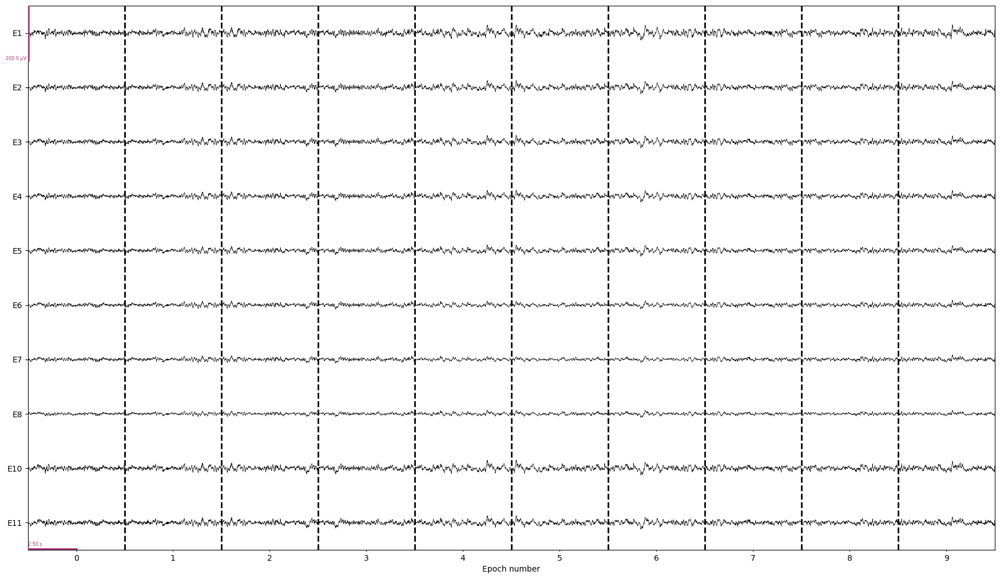

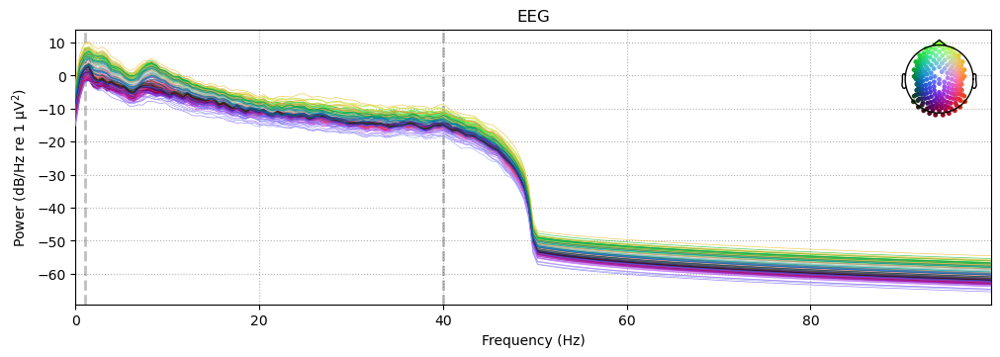

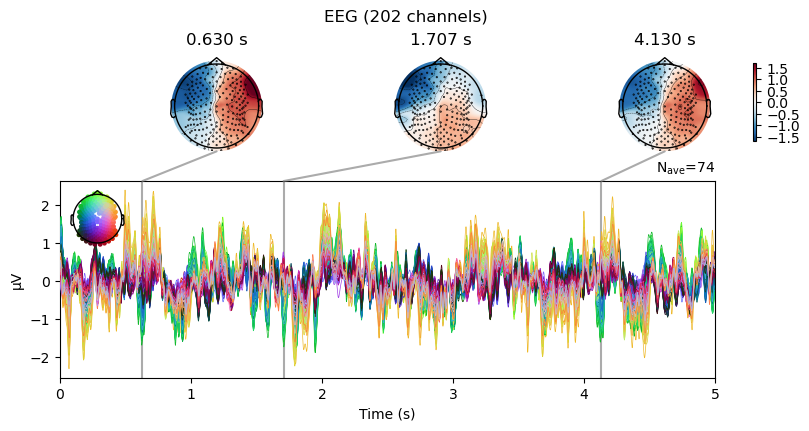

Effective window size : 2.048 (s)
Plotting power spectral density (dB=True).
Averaging across epochs before plotting...


In [46]:
# epochs_interpolated
epochs_plot_interpolated, _, epochs_plot_psd_interpolated = plot_epochs(
    epochs_ar, figures_path, subject, stage="final_interpolared_epochs"
)
# Add figures to the report
report.add_figure(epochs_plot, title="Interpolated epochs")
report.add_figure(epochs_plot_psd, title="Interpolated epochs - PSD")

In [47]:
from specparam.plts.spectra import plot_spectra
from specparam import SpectralGroupModel


fg = SpectralGroupModel(
    peak_width_limits=[1, 6],
    min_peak_height=0.15,
    peak_threshold=2.0,
    max_n_peaks=6,
    verbose=False,
)

In [49]:
psd = epochs_ar.compute_psd().average()
spectra, freqs = psd.get_data(return_freqs=True)
# Initialize a FOOOFGroup object, with desired settings

# Define the frequency range to fit
freq_range = [2, 40]
fg.fit(freqs, spectra, freq_range)
fg.plot()

    Using multitaper spectrum estimation with 7 DPSS windows


/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: divide by zero encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: overflow encountered in matmul
  return xp.matmul(x1, x2, **kwargs)
/Users/daniel/.pyenv/versions/psd-paths-3.13/lib/python3.13/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:552: RuntimeWarning: invalid value encountered in matmul
  return xp.matmul(x1, x2, **kwargs)


In [50]:
channel_names = epochs_ar.info["ch_names"]
df_channels = pd.DataFrame({"ID": range(len(channel_names)), "ch": channel_names})

df = specparam2pandas(fg)
df = df.merge(df_channels, on="ID")
df["sub_id"] = subject


# Get the current date and time
now = datetime.now()
df["timestamp"] = now
df["nr_intepolated_channels"] = len(epochs_ar.info["bads"])
df["nr_dropped_ica"] = len(ica.exclude)
df["nr_retained_ica"] = ica.n_components_ - len(ica.exclude)
# Create a new list of column names
cols = ["ch"] + [col for col in df.columns if col != "ch"]

# Reorder the columns
df = df[cols]

# Plot R and exponent across the scalp


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


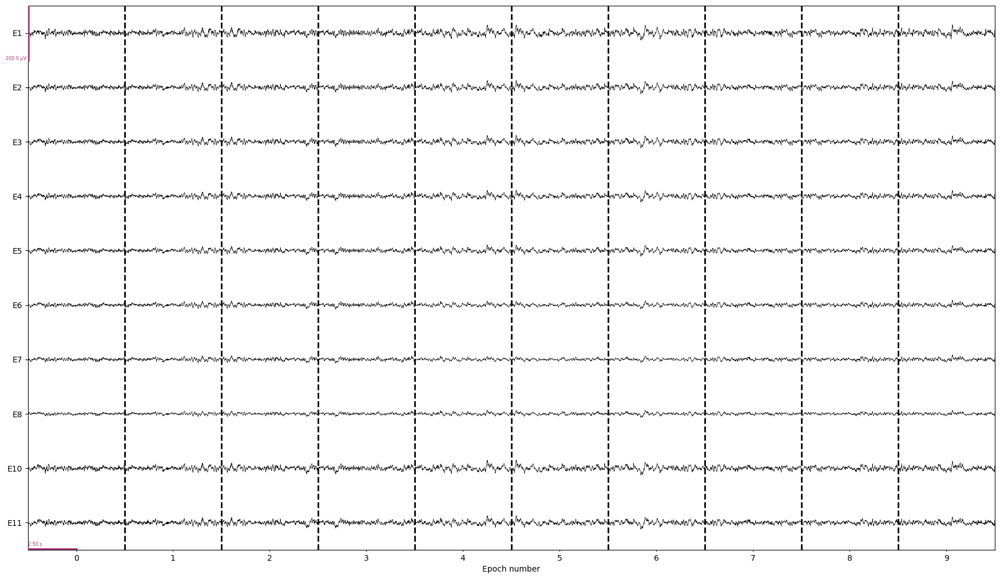

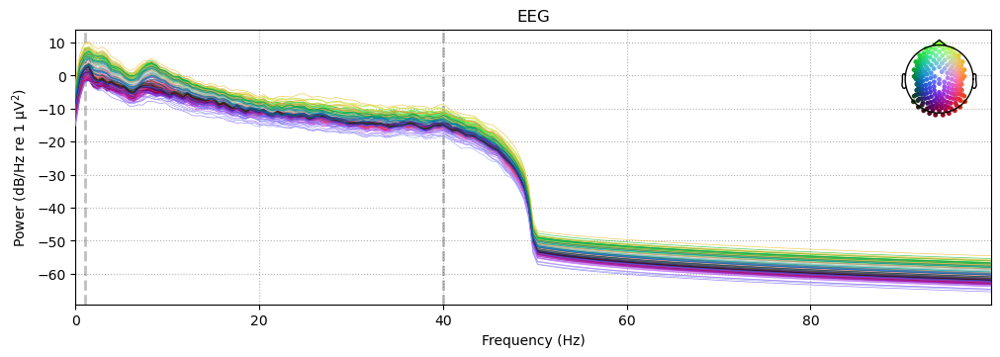

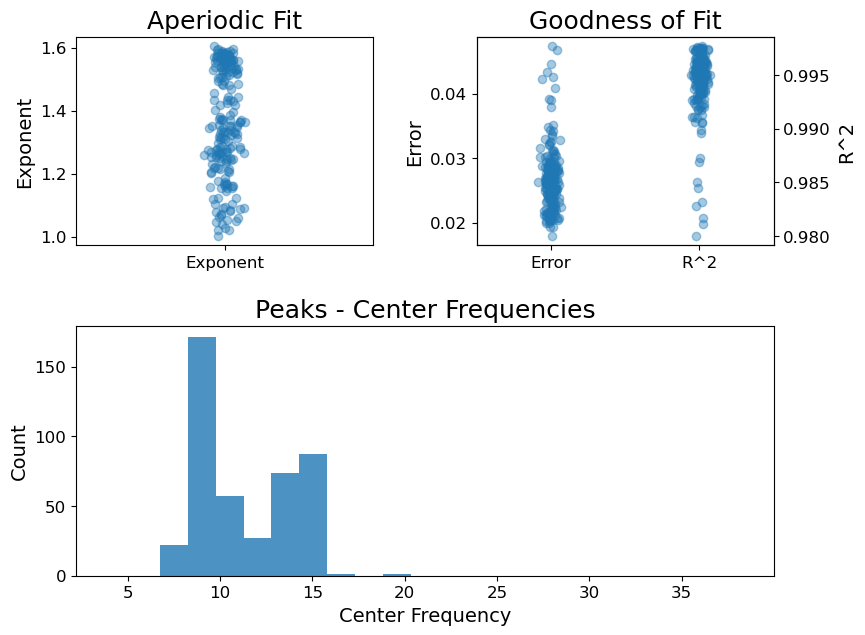

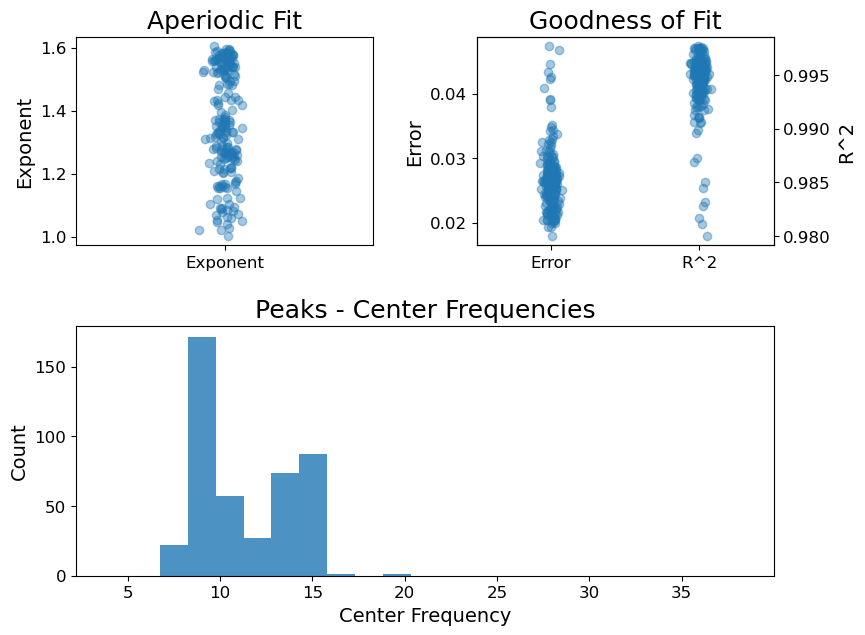

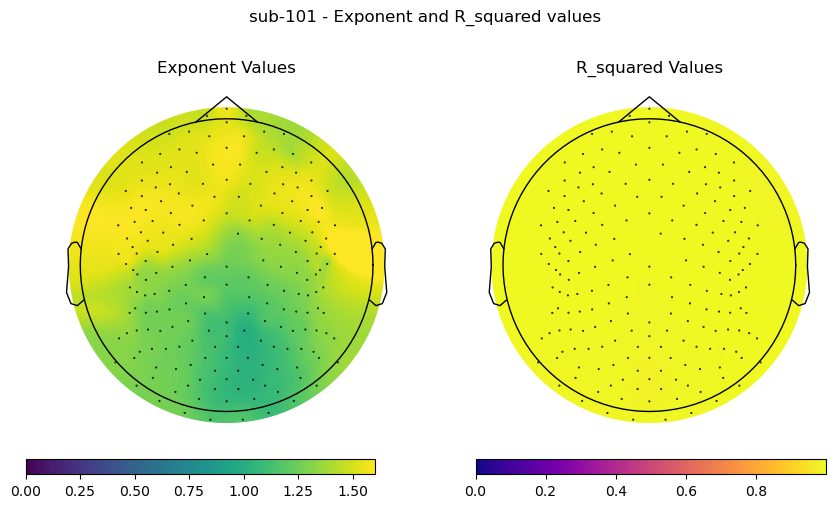

In [51]:
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np
import mne  # Make sure you have the MNE library installe


def exclude_bad_channels(epochs):
    """Modify to MNE object to exclude bad channels"""
    all_channels = epochs.info["ch_names"]
    bad_channels = epochs.info["bads"]
    good_channels = [ch for ch in all_channels if ch not in bad_channels]
    epochs_good = epochs.copy().pick_channels(good_channels)
    return epochs_good


epochs_ar_good = exclude_bad_channels(epochs_ar)

# Extract aperiodic exponent values
exps = fg.get_params("aperiodic_params", "exponent")
r_squared = fg.get_params("r_squared")

# Assuming 'exps' is your data array and 'raw' is an MNE raw object
# Also, assuming 'unit_label' and 'fontsize' variables are defined

fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# The 'cmap' parameter expects a colormap object, not a string
im1, _ = mne.viz.plot_topomap(
    exps, epochs_ar_good.info, axes=axs[0], cmap="viridis", contours=0, show=False
)
axs[0].set_title("Exponent Values")

#  Colorbar setup for the first subplot at the bottom
cbar_ax1 = fig.add_axes([0.1, 0.05, 0.35, 0.03])
fig.colorbar(im1, cax=cbar_ax1, orientation="horizontal")


# Plot the 'errors' data in the second subplot
im2, _ = mne.viz.plot_topomap(
    r_squared,
    epochs_ar_good.info,
    axes=axs[1],
    cmap="plasma",
    contours=0,
    show=False,
)
axs[1].set_title("R_squared Values")

# Colorbar setup for the second subplot at the bottom
cbar_ax2 = fig.add_axes([0.55, 0.05, 0.35, 0.03])
fig.colorbar(im2, cax=cbar_ax2, orientation="horizontal")
fig.suptitle(f"sub-{subject} - Exponent and R_squared values")

plt.show()
report.add_figure(fig, title="Exponent and R_squared values")

In [52]:
# Compare the power spectra between low and high exponent channels
fig, ax = plt.subplots(1, 2, figsize=(12, 6))


def argmedian(arr):
    return np.argsort(arr)[len(arr) // 2]


spectra_exp = [
    fg.get_model(np.argmin(exps)).power_spectrum,
    fg.get_model(argmedian(exps)).power_spectrum,
    fg.get_model(np.argmax(exps)).power_spectrum,
]

labels_spectra_exp = [
    f"Low Exponent {format(np.min(exps), '.2f')}",
    f"Median Exponent {format(np.median(exps), '.2f')}",
    f"High Exponent {format(np.max(exps), '.2f')}",
]

plot_spectra(
    fg.freqs,
    spectra_exp,
    ax=ax[0],
    labels=labels_spectra_exp,
)

spectra_r_squared = [
    fg.get_model(np.argmin(r_squared)).power_spectrum,
    fg.get_model(argmedian(r_squared)).power_spectrum,
    fg.get_model(np.argmax(r_squared)).power_spectrum,
]


labels_spectra_r_squared = [
    f"Low R_squared  {format(np.min(r_squared), '.2f')}",
    f"Median R_squared {format(np.median(r_squared), '.2f')}",
    f"High R_squared {format(np.max(r_squared), '.2f')}",
]


my_colors = ["blue", "green", "red"]
plot_spectra(
    fg.freqs,
    spectra_r_squared,
    ax=ax[1],
    labels=labels_spectra_r_squared,
    colors=my_colors,
)
ylim1 = ax[0].get_ylim()
ylim2 = ax[1].get_ylim()
# Set the same limits on the y-axis for both plots
ax[0].set_ylim(min(ylim1[0], ylim2[0]), max(ylim1[1], ylim2[1]))
ax[1].set_ylim(min(ylim1[0], ylim2[0]), max(ylim1[1], ylim2[1]))
fig.suptitle(
    f"sub-{subject} - Power spectra comparison between low, median and high exponent and R_squared values"
)

report.add_figure(
    fig, title="Examples of spectra as a function of exponent and R_squared values"
)

In [53]:
spectra_exp_fm = [
    fg.get_model(np.argmin(exps), regenerate=True),
    fg.get_model(argmedian(exps), regenerate=True),
    fg.get_model(np.argmax(exps), regenerate=True),
]
for fm, label in zip(spectra_exp_fm, labels_spectra_exp):
    # fm = fg.get_fooof(ind=2, regenerate=True)
    # Print results and plot extracted model fit
    fm.print_results()
    fm.plot()
    print(label)

                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 0.20 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -8.9282, 1.0033                                          
                                                                                                  
                                       2 peaks were found:                                        
          

In [54]:
spectra_r_squared_fm = [
    fg.get_model(np.argmin(r_squared), regenerate=True),
    fg.get_model(argmedian(r_squared), regenerate=True),
    fg.get_model(np.argmax(r_squared), regenerate=True),
]

for fm, label in zip(spectra_r_squared_fm, labels_spectra_r_squared):
    # fm = fg.get_fooof(ind=2, regenerate=True)
    # Print results and plot extracted model fit
    fm.print_results()
    fm.plot()
    print(label)

                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                        The model was run on the frequency range 2 - 40 Hz                        
                                 Frequency Resolution is 0.20 Hz                                  
                                                                                                  
                            Aperiodic Parameters (offset, exponent):                              
                                         -8.8000, 1.0420                                          
                                                                                                  
                                       1 peaks were found:                                        
          

In [55]:
df.to_csv(f"{paths.specparam}/sub-{subject}-specparam.csv", index=False)
print(f"Subject {subject} done")

Subject 101 done


In [57]:
report.save(
    f"{paths.reports}/sub-{subject}_report.html", overwrite=True
)

Saving report to : /Users/daniel/PhD/Projects/psd-paths/outputs/reports/sub-101/sub-101_report.html


'/Users/daniel/PhD/Projects/psd-paths/outputs/reports/sub-101/sub-101_report.html'